In [25]:

from pathlib import Path

import numpy as np
import torch
from torch.utils.data import DataLoader, DistributedSampler


import datasets
import util.misc as utils
from datasets import build_dataset, get_coco_api_from_dataset
from engine import evaluate, train_one_epoch
from models import build_model

from models.detr import SetCriterion
from torch import nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
import torchvision.transforms as T
import argparse

import math
from PIL import Image
import requests
import random

import pickle

In [40]:
#------------------------------------------------------------------------


def get_args_parser():
    parser = argparse.ArgumentParser('Set transformer detector', add_help=False)
    parser.add_argument('--lr', default=1e-4, type=float)
    parser.add_argument('--lr_backbone', default=1e-5, type=float)
    parser.add_argument('--batch_size', default=2, type=int)
    parser.add_argument('--weight_decay', default=1e-4, type=float)
    parser.add_argument('--epochs', default=300, type=int)
    parser.add_argument('--lr_drop', default=200, type=int)
    parser.add_argument('--clip_max_norm', default=0.1, type=float,
                        help='gradient clipping max norm')

    # Model parameters
    parser.add_argument('--frozen_weights', type=str, default=None,
                        help="Path to the pretrained model. If set, only the mask head will be trained")
    # * Backbone
    parser.add_argument('--backbone', default='resnet50', type=str,
                        help="Name of the convolutional backbone to use")
    parser.add_argument('--dilation', action='store_true',
                        help="If true, we replace stride with dilation in the last convolutional block (DC5)")
    parser.add_argument('--position_embedding', default='sine', type=str, choices=('sine', 'learned'),
                        help="Type of positional embedding to use on top of the image features")

    # * Transformer
    parser.add_argument('--enc_layers', default=6, type=int,
                        help="Number of encoding layers in the transformer")
    parser.add_argument('--dec_layers', default=6, type=int,
                        help="Number of decoding layers in the transformer")
    parser.add_argument('--dim_feedforward', default=2048, type=int,
                        help="Intermediate size of the feedforward layers in the transformer blocks")
    parser.add_argument('--hidden_dim', default=256, type=int,
                        help="Size of the embeddings (dimension of the transformer)")
    parser.add_argument('--dropout', default=0.1, type=float,
                        help="Dropout applied in the transformer")
    parser.add_argument('--nheads', default=8, type=int,
                        help="Number of attention heads inside the transformer's attentions")
    parser.add_argument('--num_queries', default=100, type=int,
                        help="Number of query slots")
    parser.add_argument('--pre_norm', action='store_true')

    
    ####################### @amirhnazerii #######################
    ##### start 03/27/2025
    # * Classification head
    parser.add_argument('--new_layer_dim', default=None, type=int,
                        help="classification head added fc-layer dim")
    parser.add_argument('--num_classes', type=int, default=None,
                        help="Number of classes in dataset+1")
    
    # * Segmentation
    parser.add_argument('--masks', action='store_true',
                        help="Train segmentation head if the flag is provided")

    # Loss
    parser.add_argument('--no_aux_loss', dest='aux_loss', action='store_false',
                        help="Disables auxiliary decoding losses (loss at each layer)")
    # * Matcher
    parser.add_argument('--set_cost_class', default=1, type=float,
                        help="Class coefficient in the matching cost")
    parser.add_argument('--set_cost_bbox', default=5, type=float,
                        help="L1 box coefficient in the matching cost")
    parser.add_argument('--set_cost_giou', default=2, type=float,
                        help="giou box coefficient in the matching cost")
    # * Loss coefficients
    parser.add_argument('--mask_loss_coef', default=1, type=float)
    parser.add_argument('--dice_loss_coef', default=1, type=float)
    parser.add_argument('--bbox_loss_coef', default=5, type=float)
    parser.add_argument('--giou_loss_coef', default=2, type=float)
    parser.add_argument('--eos_coef', default=0.1, type=float,
                        help="Relative classification weight of the no-object class")

    # dataset parameters
    parser.add_argument('--dataset_file', default='coco')
    parser.add_argument('--coco_path', type=str)
    parser.add_argument('--coco_panoptic_path', type=str)
    parser.add_argument('--remove_difficult', action='store_true')

    parser.add_argument('--output_dir', default='',
                        help='path where to save, empty for no saving')
    parser.add_argument('--device', default='cuda',
                        help='device to use for training / testing')
    parser.add_argument('--seed', default=42, type=int)
    parser.add_argument('--resume', default='', help='resume from checkpoint')
    parser.add_argument('--start_epoch', default=0, type=int, metavar='N',
                        help='start epoch')
    parser.add_argument('--eval', action='store_true')
    parser.add_argument('--num_workers', default=2, type=int)

    # distributed training parameters
    parser.add_argument('--world_size', default=1, type=int,
                        help='number of distributed processes')
    parser.add_argument('--dist_url', default='env://', help='url used to set up distributed training')
    
    
    # robustness param:
    parser.add_argument('--robust', default=False, type=bool,
                        help='nrobust detr training with modified loss function.')
 
    
    return parser


#------------------------------------------------------------------------





In [41]:
!pwd + 'dd'

/home/anazeri/detr_finetune


In [105]:
parser = argparse.ArgumentParser('DETR training and evaluation script', parents=[get_args_parser()])
args = parser.parse_args(args=['--resume', '/home/anazeri/detr_finetune/detr-r50-KITTI-orighead92fc-80epch/checkpoint0079.pth',
                              '--coco_path', '/scratch/anazeri/kitti_coco_format/kitti_val/',
                              '--num_classes', "9",
                            '--device', 'cpu',
                              ])
args.batch_size = 1
args.no_aux_loss = True
args.eval = True



# args.resume = 'https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth'
# args.resume = '/scratch/anazeri/outputs11202023_R50_kitti_imgs6481_epch25/eval/checkpoint.pth'
# args.coco_path = '/scratch/anazeri/kitti_coco_format/kitti_val/'

In [106]:
# PATH =  '/home/anazeri/'
# checkpoint = torch.load(PATH + 'detr_finetune/detr-r50-modifhead-128fc92fc.pth', map_location='cpu')
# checkpoint['model'].keys()

In [107]:
# COCO classes
CLASSES = ["Car", "Cyclist", "DontCare", "Misc", "Pedestrian",
"Person_sitting", "Tram", "Truck", "Van"]
 


# colors for visualization
COLORS = [[0.000, 0.447, 0.741], [0.850, 0.325, 0.098], [0.929, 0.694, 0.125],
          [0.494, 0.184, 0.556], [0.466, 0.674, 0.188], [0.301, 0.745, 0.933]]



# standard PyTorch mean-std input image normalization
transform = T.Compose([
    T.Resize(800),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# for output bounding box post-processing
def box_cxcywh_to_xyxy(x):
    x_c, y_c, w, h = x.unbind(1)
    b = [(x_c - 0.5 * w), (y_c - 0.5 * h),
         (x_c + 0.5 * w), (y_c + 0.5 * h)]
    return torch.stack(b, dim=1)

def rescale_bboxes(out_bbox, size):
    img_w, img_h = size
    b = box_cxcywh_to_xyxy(out_bbox)
    b = b * torch.tensor([img_w, img_h, img_w, img_h], dtype=torch.float32)
    return b


def plot_results(pil_img, prob, boxes):
    plt.figure(figsize=(16*2,10*2))
    plt.imshow(pil_img)
    ax = plt.gca()
    colors = COLORS * 100
    for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), colors):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3))
        cl = p.argmax()
        text = f'{CLASSES[cl]}: {p[cl]:0.2f}'
        ax.text(xmin, ymin, text, fontsize=15,
                bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.show()



#------------------------------------------------------------------------

# device = torch.device(args.device)
args.device = 'cpu'

seed = args.seed + utils.get_rank()
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)
model, criterion, postprocessors = build_model(args)
# model.to(device)
model_without_ddp = model
n_parameters = sum(p.numel() for p in model.parameters() if p.requires_grad)
print('number of params:', n_parameters)


if args.resume:
    if args.resume.startswith('https'):
        checkpoint = torch.hub.load_state_dict_from_url(
            args.resume, map_location='cpu', check_hash=True)
    else:
        checkpoint = torch.load(args.resume, map_location='cpu')
        
    model_without_ddp.load_state_dict(checkpoint['model'])
    

for param in model.parameters():
    param.requires_grad = False

number of params: 41281294


In [108]:
# checkpoint['model']['class_embed.0.bias']

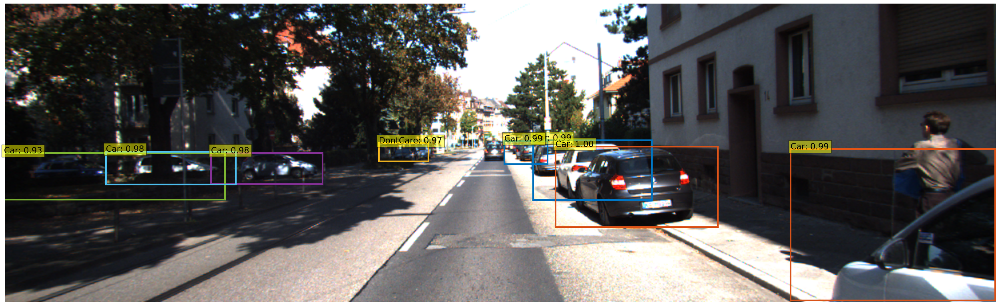

In [109]:

PATH_img = "/scratch/anazeri/kitti_coco_format/kitti_val/val2017/002176.png"
im = Image.open(PATH_img)
# PATH = '/scratch/anazeri/outputs11202023_R50_kitti_imgs6481_epch25/eval/checkpoint.pth'
# checkpoint = torch.load(PATH)
# torch.load_state_dict(checkpoint)
# model.eval()

def ObjDet_one_img(im):

    # mean-std normalize the input image (batch-size: 1)
    img = transform(im).unsqueeze(0)

    # propagate through the model
    outputs = model(img)

    # keep only predictions with 0.7+ confidence
    probas = outputs['pred_logits'].softmax(-1)[0, :, :-1]
    keep = probas.max(-1).values > 0.9

    # convert boxes from [0; 1] to image scales
    # device = 'cuda'
    bboxes_scaled = rescale_bboxes(outputs['pred_boxes'][0, keep], im.size)#, device)

    return plot_results(im, probas[keep], bboxes_scaled)

clean= ObjDet_one_img(im)

### T.Resize(800)
clean:
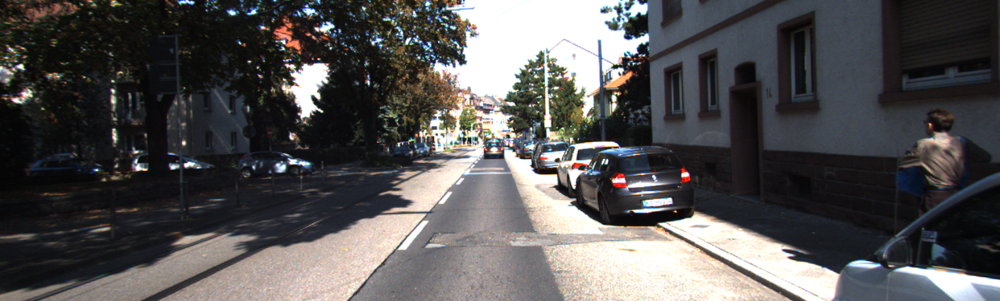
checkpoint0023:
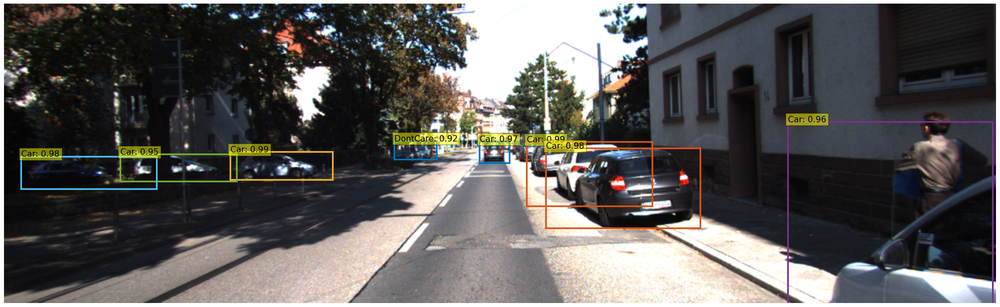
checkpoint0071:
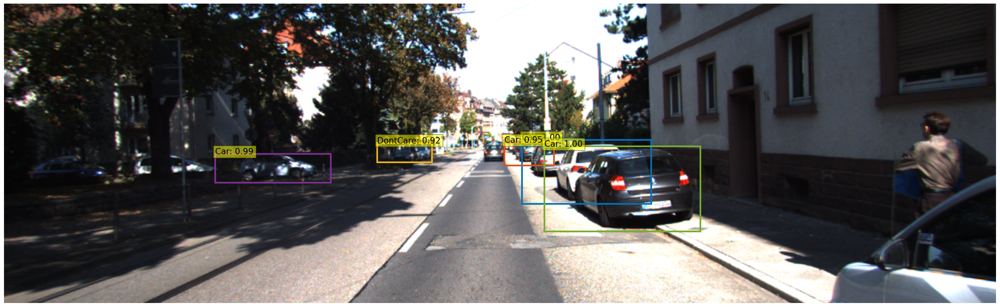
checkpoint0079:
<!-- ![download.png](attachment:58809b4b-efa9-4f87-967d-2674af8a209a.png) -->

### T.Resize(800)
clean:
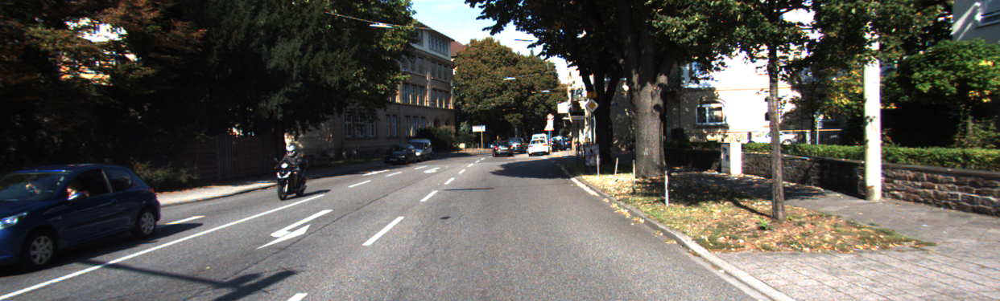
checkpoint0023:
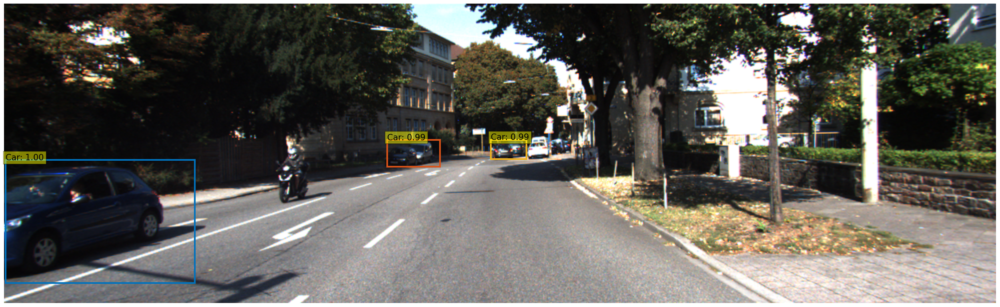
checkpoint0071:
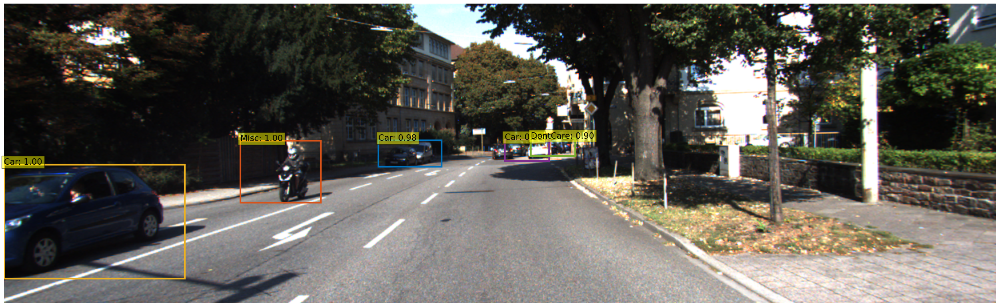

In [21]:
log_path = '/home/anazeri/detr_finetune/detr-r50-KITTI-orighead92fc-80epch/checkpoint.pth'
log_last = torch.load(log_path, map_location = 'cpu

In [22]:
log_last.keys()

dict_keys(['model', 'optimizer', 'lr_scheduler', 'epoch', 'args'])

In [24]:
log_last['epoch']

79

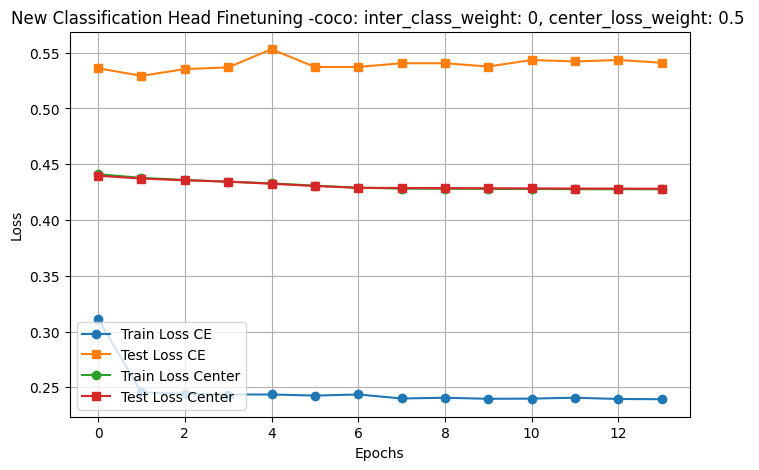

In [54]:
import json
log_path = '/home/anazeri/detr_finetune/robust-detr-r50-coco-inter_class_weight0-center_loss_weight05-modifhead-128fc92fc-TEMP/log.txt'
logs = []
with open(log_path, 'r') as f:
    for line in f:
        logs.append(json.loads(line))

import matplotlib.pyplot as plt

# Extract values
epochs = [entry["epoch"] for entry in logs]
train_loss_ce = [entry["train_loss_ce"] for entry in logs]
test_loss_ce = [entry["test_loss_ce"] for entry in logs]  
train_loss_center = [entry["train_loss_center"] for entry in logs]
test_loss_center = [entry["test_loss_center"] for entry in logs]

# Plot
plt.figure(figsize=(8, 5))
plt.plot(epochs, train_loss_ce, label='Train Loss CE', marker='o')
plt.plot(epochs, test_loss_ce, label='Test Loss CE', marker='s')
plt.plot(epochs, train_loss_center, label='Train Loss Center', marker='o')
plt.plot(epochs, test_loss_center, label='Test Loss Center', marker='s')

plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('New Classification Head Finetuning -coco: inter_class_weight: 0, center_loss_weight: 0.5 ')
plt.legend()
plt.grid()
plt.show()

# Finetuned DETR on KITTI
## Inference: 
#### To look up the best checkpoint 'epoch'

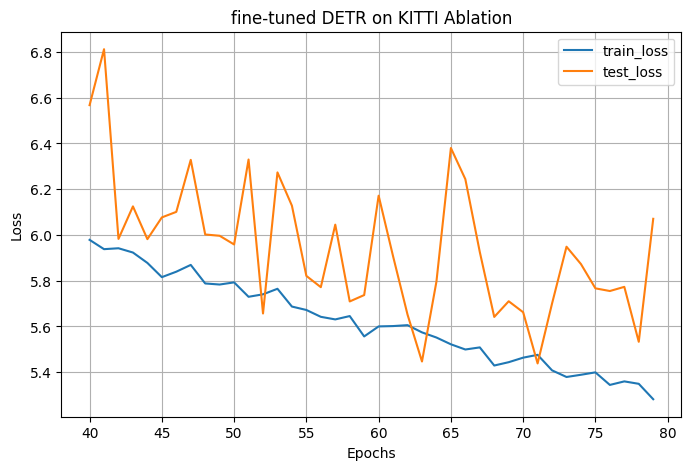

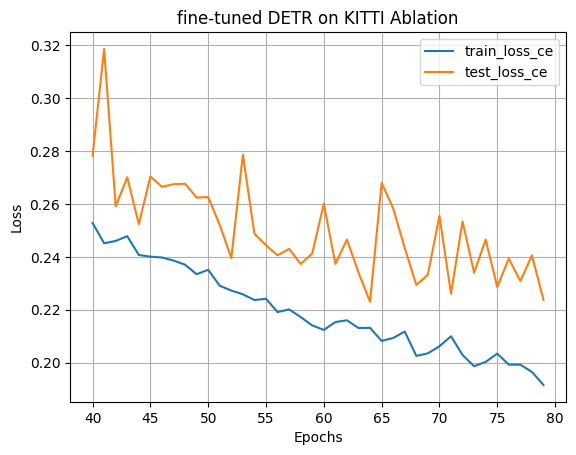

In [11]:
import json
log_path = '/home/anazeri/detr_finetune/detr-r50-KITTI-orighead92fc-80epch/log.txt'
logs = []
with open(log_path, 'r') as f:
    for line in f:
        logs.append(json.loads(line))

import matplotlib.pyplot as plt



# Extract values
epochs = [entry["epoch"] for entry in logs]
train_loss_ce = [entry["train_loss_ce"] for entry in logs]
test_loss_ce = [entry["test_loss_ce"] for entry in logs]  
train_loss = [entry["train_loss"] for entry in logs]
test_loss = [entry["test_loss"] for entry in logs]

loss_list = [train_loss, test_loss, train_loss_ce, test_loss_ce]
loss_list_label = ["train_loss", "test_loss", "train_loss_ce", "test_loss_ce"]

plt.figure(figsize=(8, 5))
for i, (pl, _label) in enumerate(zip(loss_list, loss_list_label)):
    plt.plot(epochs, pl, label= _label)
    if i == 1 or i == 3:        
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.title('fine-tuned DETR on KITTI Ablation')
        plt.legend()
        plt.grid()
        plt.show()
        
"""
epoch = 71 is best:

 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.423
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.739
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.431
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.318
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.406
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.539
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.330
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.542
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.576
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.451
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.562
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.695
"""


# Original DETR



### Extract Clean features
✅


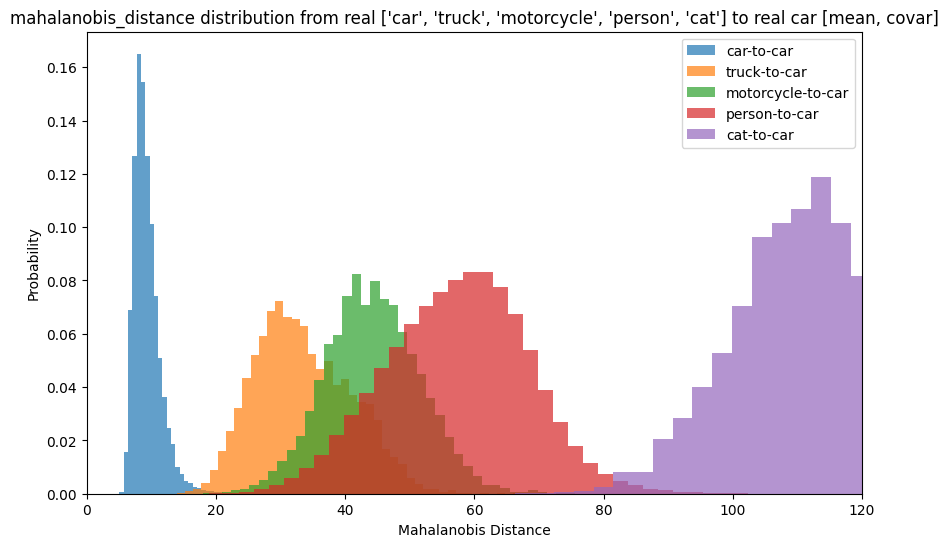





## FGSM

/scratch/anazeri/fgsm/coco/coco_origsiz_SavImg_detr_DETR_r50_fgsm_eps05/


### mAP: Adv vs. Clean



```
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.149
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.255
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.150
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.039
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.154
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.272
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.160
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.256
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.285
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.080
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.300
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.483
```







### Extract Adv features

✅

```
python modified_main_adv.py \
     --dataset_file "coco" \
        --coco_path "/scratch/anazeri/coco/" \
            --resume "/home/anazeri/detr_finetune_local/detr-r50-coco-modifhead-128fc92fc-TEMP/checkpoint0002.pth" \
                --backbone 'resnet50' \
                    --adversarial \
                        --adv_img_path "/scratch/anazeri/fgsm/coco/coco_origsiz_SavImg_detr_DETR_r50_fgsm_eps05/"\
                            --confidence_threshold 0.9 \
                                --features_save_path "/scratch/anazeri/coco/adv_fgsm_eps05_features-original-detr-r50-coco/" \
                                    --save_interval 1000 \
                                         --new_layer_dim 128

```


### Mahalabonis distribution: Adv vs. Clean
✅

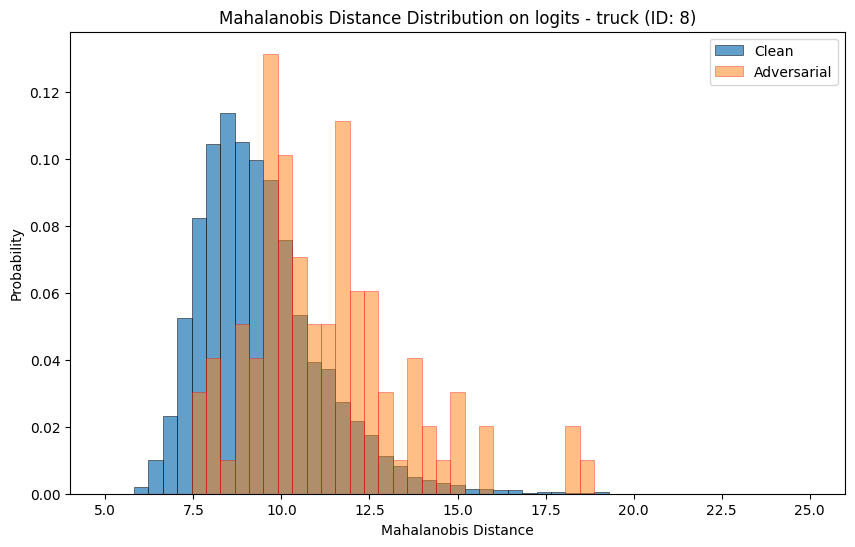
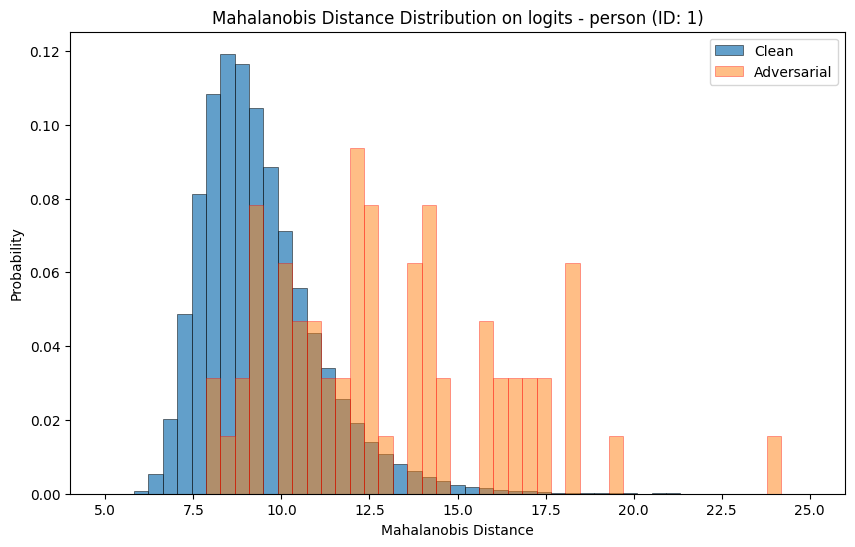
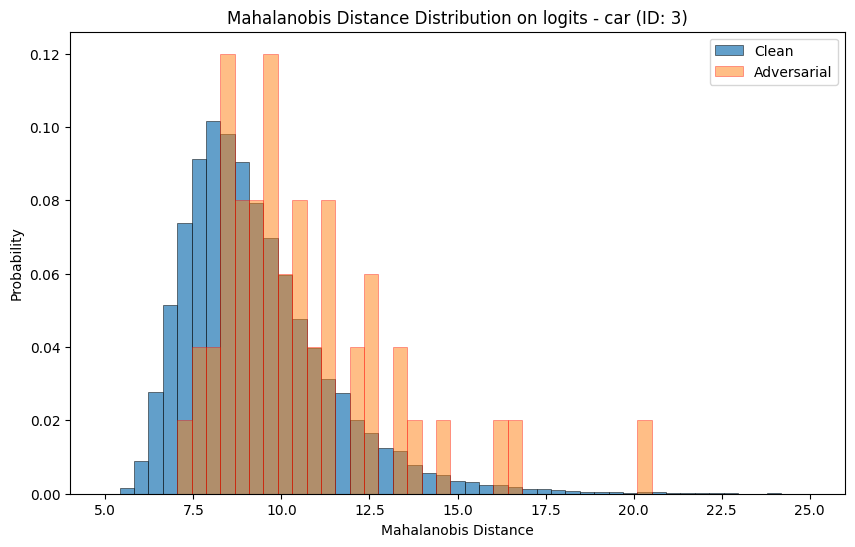








## PGD




### mAP: Adv


```
/scratch/anazeri/pgd/coco/coco_origsiz_SavImg_detr_DETR_r50_pgd_05_iters100_stepsize02/

 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.147
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.290
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.132
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.045
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.155
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.269
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.161
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.261
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.288
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.096
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.309
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.477
```




### Extract Adv features

```
python modified_main_adv.py \
     --dataset_file "coco" \
        --coco_path "/scratch/anazeri/coco/" \
            --resume "/home/anazeri/detr_finetune_local/detr-r50-coco-modifhead-128fc92fc-TEMP/checkpoint0002.pth" \
                --backbone 'resnet50' \
                    --adversarial \
                        --adv_img_path "/scratch/anazeri/pgd/coco/coco_origsiz_SavImg_detr_DETR_r50_pgd_05_iters100_stepsize02/"\
                            --confidence_threshold 0.9 \
                                --features_save_path "/scratch/anazeri/coco/adv_pgd_05_iters100_stepsize02_features-original-detr-r50-coco/" \
                                    --save_interval 1000 \
                                         --new_layer_dim 128

```




### Mahalabonis distribution: Adv vs. Clean
✅
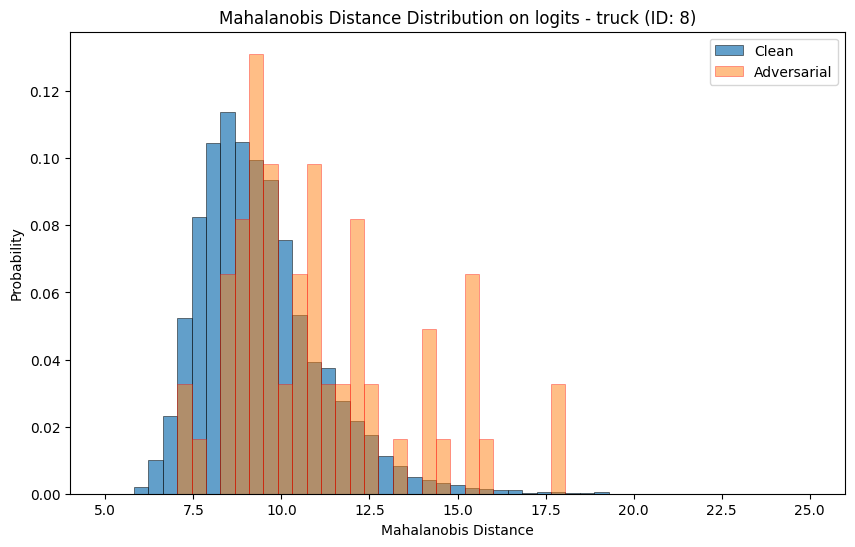
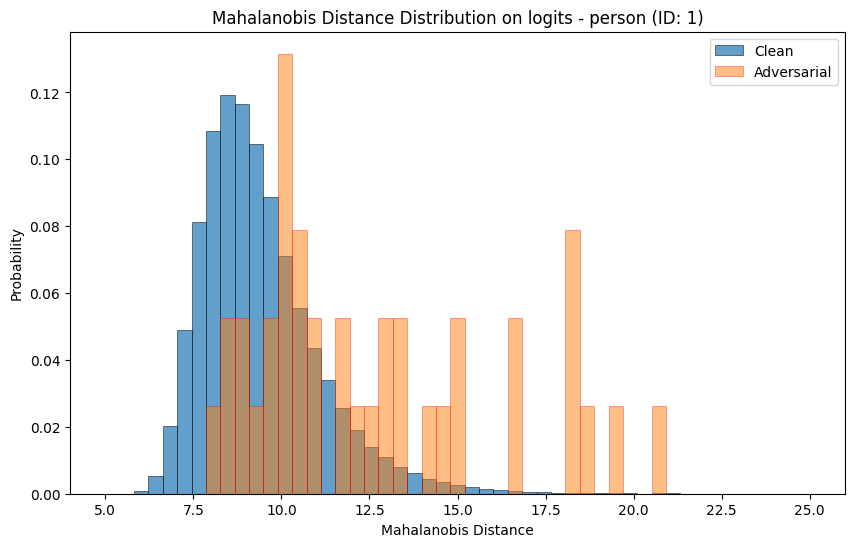
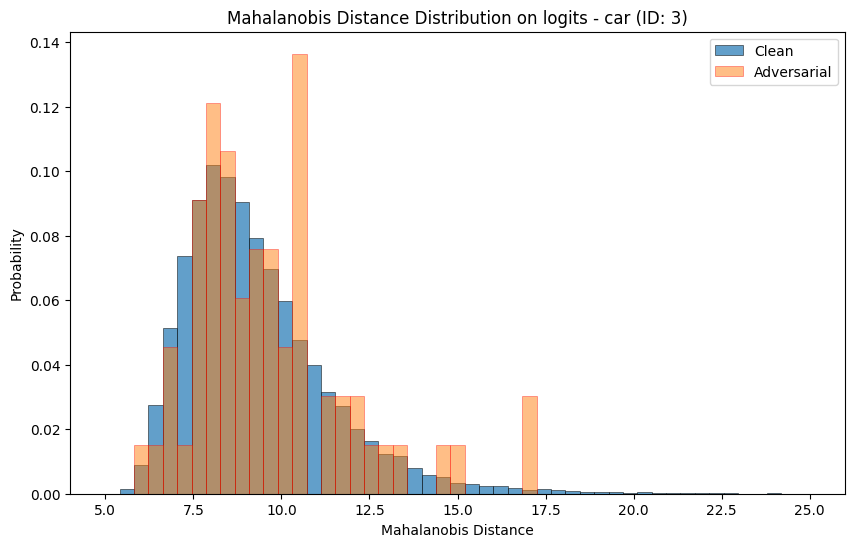


## DAG




### mAP: Adv


```
/scratch/anazeri/dag/coco/coco_origsiz_SavImg_detr_DETR_r50_dag_05_iters100_stepsize02_target_class_1/


White-box: Original DETR to Original DETR
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.018
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.033
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.017
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.006
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.020
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.037
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.033
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.052
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.060
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.013
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.056
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.113


Blackbox: Original DETR to a DETR with different head (transferability) 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.204
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.329
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.210
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.082
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.225
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.306
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.198
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.324
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.359
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.140
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.389
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.544




```




### Extract Adv features

```
python modified_main_adv.py \
     --dataset_file "coco" \
        --coco_path "/scratch/anazeri/coco/" \
            --resume "/home/anazeri/detr_finetune_local/detr-r50-coco-modifhead-128fc92fc-TEMP/checkpoint0002.pth" \
                --backbone 'resnet50' \
                    --adversarial \
                        --adv_img_path "/scratch/anazeri/dag/coco/coco_origsiz_SavImg_detr_DETR_r50_dag_05_iters100_stepsize02_target_class_1/"\
                            --confidence_threshold 0.5 \
                                --features_save_path "/scratch/anazeri/coco/adv_dag_05_iters100_stepsize02_target_class_1-original-detr-r50-coco_confith_05/" \
                                    --save_interval 1000 \
                                         --new_layer_dim 128

```




### Mahalabonis distribution: Adv vs. Clean
✅
<!-- ![clean-pdg05-same-cls-truck.png](attachment:Untitled-10.png)
![clean-pdg05-same-cls-person.png](attachment:Untitled-9.png)
![clean-pdg05-same-cls-car.png](attachment:Untitled-11.png)
 -->


# Customized DETR: new head and Loss

✅

### Optimal
```
robust-detr-r50-coco-inter_class_weight0-center_loss_weight05-modifhead-128fc92fc-TEMP/checkpoint0006.pth
```





### Extract Clean features
✅


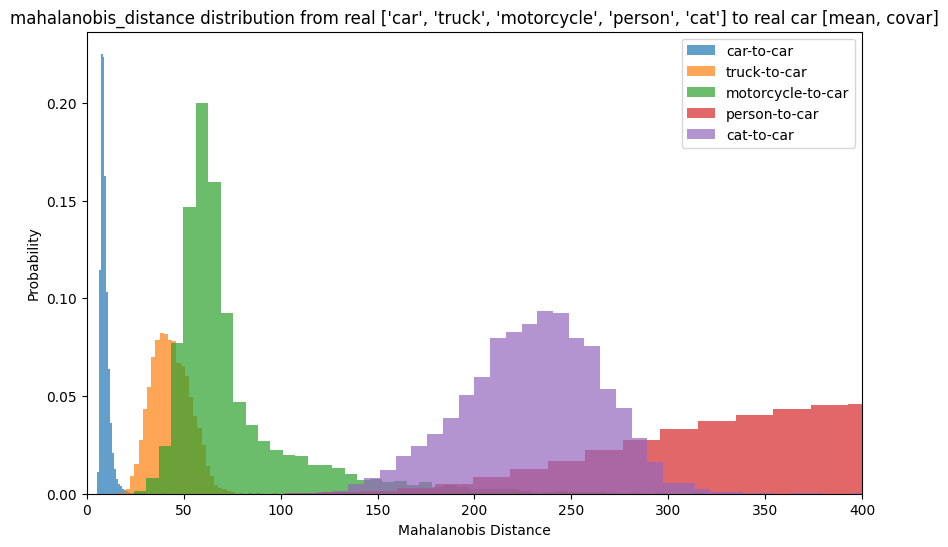




## FGSM transfered

/scratch/anazeri/fgsm/coco/coco_origsiz_SavImg_detr_DETR_r50_fgsm_eps05/


### mAP: Adv


```
/scratch/anazeri/coco/adv_fgsm_eps05_features_robust-detr-r50-coco-inter_class_weight0-center_loss_weight05


 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.171
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.281
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.173
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.075
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.190
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.255
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.176
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.286
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.319
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.121
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.342
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.492

```





### Extract Adv features

✅

```
python modified_main_adv.py \
     --dataset_file "coco" \
        --coco_path "/scratch/anazeri/coco/" \
            --resume "/home/anazeri/detr_finetune/robust-detr-r50-coco-inter_class_weight0-center_loss_weight05-modifhead-128fc92fc-TEMP/checkpoint0006.pth" \
                --backbone 'resnet50' \
                    --adversarial \
                        --adv_img_path "/scratch/anazeri/fgsm/coco/coco_origsiz_SavImg_detr_DETR_r50_fgsm_eps05/"\
                            --confidence_threshold 0.9 \
                                --features_save_path "/scratch/anazeri/coco/adv_fgsm_eps05_features_robust-detr-r50-coco-inter_class_weight0-center_loss_weight05" \
                                    --save_interval 1000 \
                                         --new_layer_dim 128
```


### Mahalabonis distribution: Adv vs. Clean
✅
```
adv_parent = "/scratch/anazeri/coco/adv_fgsm_eps05_features_robust-detr-r50-coco-inter_class_weight0-center_loss_weight05/"
adv_path = "adv_misclassified_features_coco_origsiz_SavImg_detr_DETR_r50_fgsm_eps05_val_imgs_4000.pkl"   
```
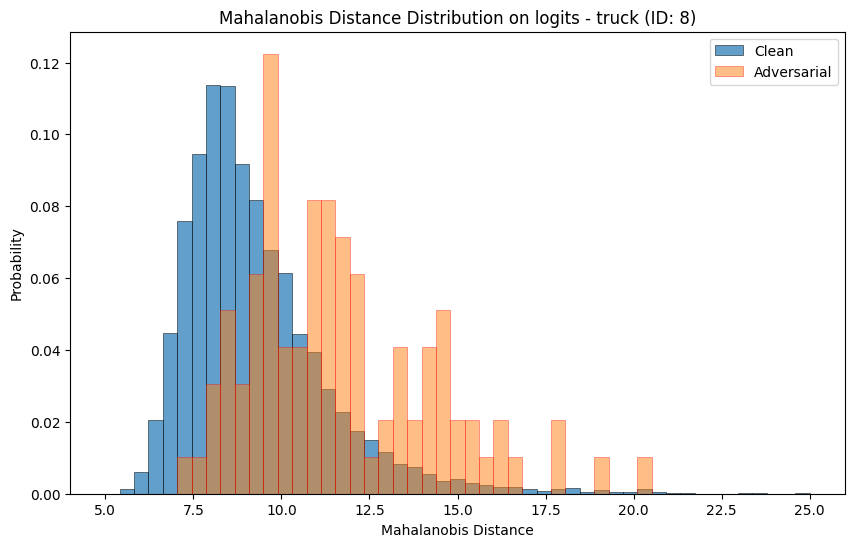
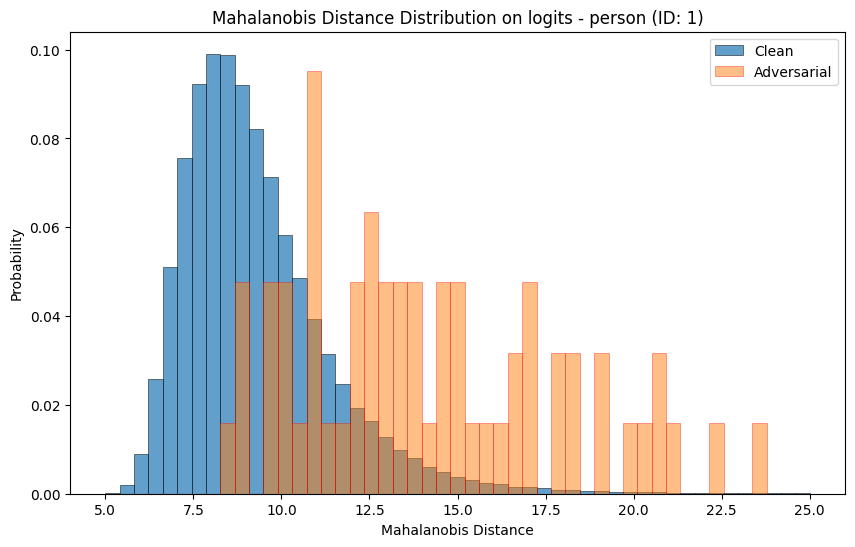
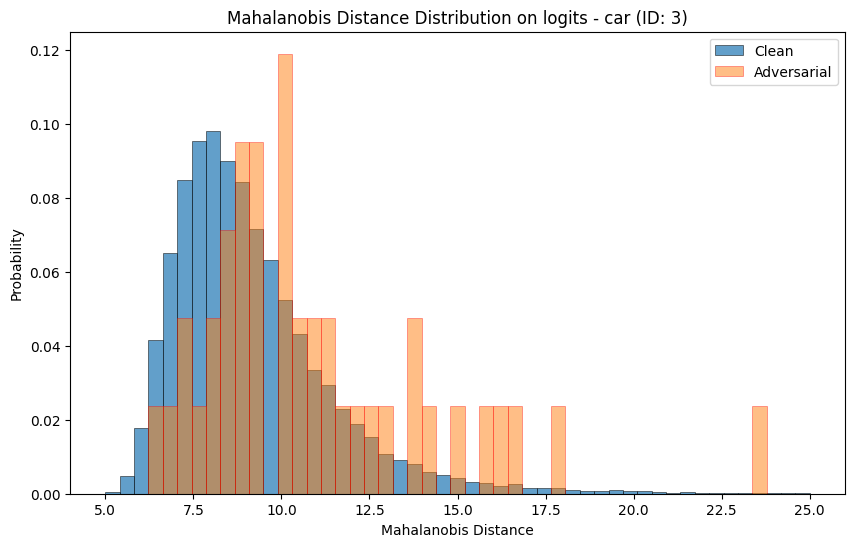









## PGD




### mAP: Adv

```
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.284
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.464
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.288
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.138
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.310
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.412
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.245
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.397
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.437
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.206
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.479
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.635
```




### Extract Adv features

✅

```
python modified_main_adv.py \
     --dataset_file "coco" \
        --coco_path "/scratch/anazeri/coco/" \
            --resume "/home/anazeri/detr_finetune/robust-detr-r50-coco-inter_class_weight0-center_loss_weight05-modifhead-128fc92fc-TEMP/checkpoint0006.pth" \
                --backbone 'resnet50' \
                    --adversarial \
                        --adv_img_path "/scratch/anazeri/pgd/coco/coco_origsiz_SavImg_detr_DETR_r50_pgd_05_iters100_stepsize02/"\
                            --confidence_threshold 0.9 \
                                --features_save_path "/scratch/anazeri/coco/adv_pgd_05_iters100_stepsize02_features-detr-r50-coco-inter_class_weight0-center_loss_weight05" \
                                    --save_interval 1000 \
                                         --new_layer_dim 128
```




### Mahalabonis distribution: Adv vs. Clean
✅
```
/scratch/anazeri/coco/adv_pgd_05_iters100_stepsize02_features-detr-r50-coco-inter_class_weight0-center_loss_weight05

```
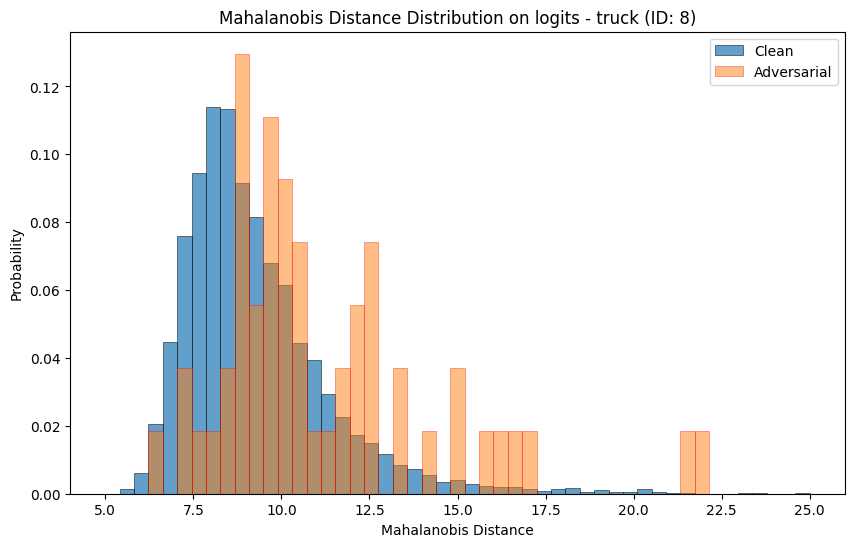
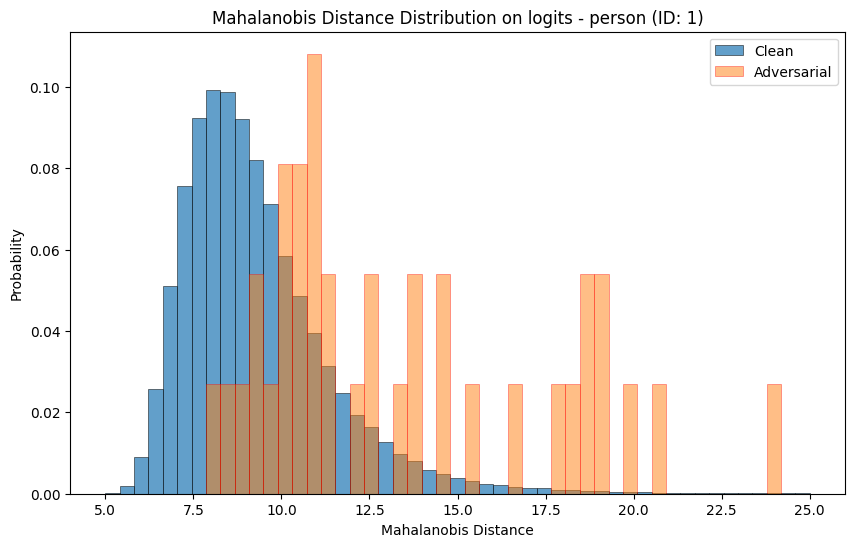
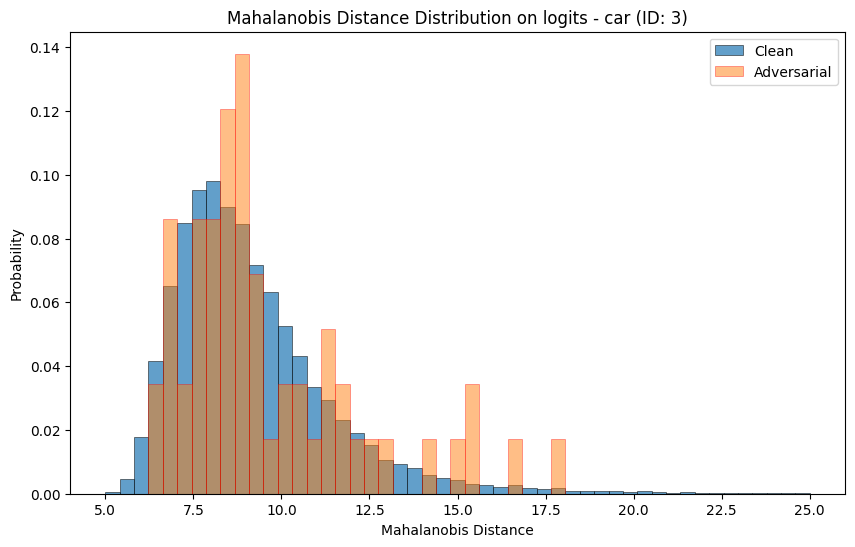
